In [1]:
#import package

import pandas as pd
import string
import nltk
import re
import sys
import numpy as np
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

from collections import Counter
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

mpl.rcParams['figure.figsize']=(10.0,8.0)    #(6.0,4.0)
mpl.rcParams['font.size']=10                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1

In [2]:
#input data

input=pd.read_csv('D:\KULIAH S2\TESIS\data_keluhan_coba.csv',header=0,encoding='utf8')
input_df=pd.DataFrame(data=input)
pd.options.display.max_colwidth=2000
print(input_df)  

        no  keluhan_id  \
0        1        8550   
1        2        2037   
2        3        4933   
3        4        8551   
4        5        8552   
5        6        8553   
6        7        8554   
7        8        8555   
8        9         238   
9       10        8556   
10      11        8557   
11      12         273   
12      13        8558   
13      14         269   
14      15         256   
15      16        3215   
16      17        8560   
17      18        8561   
18      19        8566   
19      20        1927   
20      21        3933   
21      22        2912   
22      23        5228   
23      24        1223   
24      25         453   
25      26         381   
26      27         387   
27      28         368   
28      29         362   
29      30        8568   
...    ...         ...   
4176  4177        8478   
4177  4178        8476   
4178  4179        8470   
4179  4180        8473   
4180  4181        8471   
4181  4182        8472   
4182  4183  

In [3]:
#ambil kolom opini

opini_df=input_df['keluhan']
print(opini_df) 


0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [4]:
#hapus baris

noline=[]
for line in opini_df :
    result=re.sub('\n',' ',line)
    noline.append(result)
    
print(noline)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang 5 no 58B ini sudah 6bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak 4 titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@e100ss sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya 

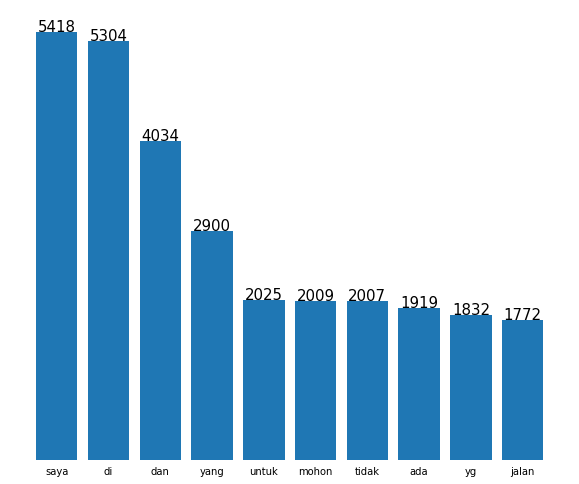

In [5]:
# Create a list of words by converting to lowercase and splitting
kata = [s.lower().split() for s in noline if s]
noline_ = [sublist for l in kata for sublist in l]
counts1 = dict(Counter(noline_).most_common(10))
labels1, values1 = zip(*counts1.items())

# sort your values in descending order
indSort1 = np.argsort(values1)[::-1]

# rearrange your data
labels1 = np.array(labels1)[indSort1]
values1 = np.array(values1)[indSort1]

indexes1 = np.arange(len(labels1))

bar_width = 1

mybar=plt.bar(indexes1, values1)
# get rid of the frame
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# remove all the ticks and directly label each bar with respective value
plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')

# plt.show()

# direct label each bar with Y axis values
for bari in mybar:
    height = bari.get_height()
    plt.gca().text(bari.get_x() + bari.get_width()/2, bari.get_height()-0.2, str(int(height)),
                 ha='center', color='black', fontsize=15)
# add labels
plt.xticks(indexes1, labels1)
plt.show()

In [6]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer()
a = vec.fit_transform(noline)
terms1 = vec.get_feature_names()
print(len(terms1))

15564


In [7]:
#hapus url link

nolink=[]
for line in noline:
    result=re.sub(r"http\S+","",line)
    nolink.append(result)
    
print(nolink)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang 5 no 58B ini sudah 6bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak 4 titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@e100ss sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya 

In [8]:
#hapus angka

from string import digits
nodigits=[]
for line in noline:
    remove_digits=str.maketrans(' ', ' ', digits)
    result=line.translate(remove_digits)
    nodigits.append(result)
print(nodigits)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@ess sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya coba mas

In [9]:
#hapus @username

nouser=[]
for line in nodigits :
    result=re.sub(r"(?:\@|https?\://)\S+", "", line)
    nouser.append(result)
    
print(nouser)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya coba masuk ke ssw surabaya, saya lihat di sana suda

In [10]:
#replace , menjadi whitespace

nocomma=[]
for line in nouser :
    result=re.sub(r"[,./]+", " ", line)
    nocomma.append(result)
    
print(nocomma)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat  Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik  Mohon untuk segera ditindaklanjuti  Terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl  Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu  Lokasi di TPU Medokan Ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [11]:
#remove punctuation
nopunc=[]
for line in nocomma:
    punc = set(string.punctuation)-set('-')
    result = ''.join(x for x in line if x not in punc)
    nopunc.append(result)
print(nopunc)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat  Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik  Mohon untuk segera ditindaklanjuti  Terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl  Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu  Lokasi di TPU Medokan Ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [12]:
#casefolding

lower=[]
for line in nopunc:
    a=line.lower()
    lower.append(a)

print(lower)

['saya ingin menginfokan kondisi air pdam daerah simo pomahan baru barat gang  no b ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'kepada pemkot surabaya setempat  saya ingin melaporkan penuhnya sampah pada got di simolawang baru sekolahan gang ii  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  terimakasih robert prayogo', 'saya ingin melaporkan lampu pertamanan jalan kedung sroko i  surabaya mati semua sebanyak  titik  mohon untuk segera ditindaklanjuti  terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang jl  banyu urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  terima kasih', ' mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah kelurahan medokan ayu  lokasi di tpu medokan ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [13]:
factory=StemmerFactory()
stemmer=factory.create_stemmer()
stemmed=map(lambda x: stemmer.stem(x), lower)
stemmed_list=list(stemmed)

In [14]:
#import stop words

stop=open('D:\KULIAH S2\TESIS\stopwordbahasa 2.csv', 'r',encoding='utf8')
stopword = []
# Convert lines into string list.
for line in stop.readlines():
    stopword.append(line.rstrip())
print(stopword)

['a', 'ada', 'adalah', 'adanya', 'adapun', 'admin', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'assalamualaikum', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'b', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'b

In [15]:
#remove stopwords

from nltk.tokenize import word_tokenize

trainfinal = []
for line in stemmed_list: 
    word_token = nltk.word_tokenize(line) # get word token for every line (split line into each separate words)
    word_token = [word for word in word_token if not word in stopword] # remove indonesian stop words
    trainfinal.append(" ".join(word_token))
print(trainfinal)

['info kondisi air pdam daerah simo pomahan barat gang keruh bau minum cuci susah terimakasii', 'pemkot lapor penuh sampah got simolawang sekolah gang ii salur buntu banjir hujan lebat mohn tangan terimakasih robert prayogo', 'lapor lampu taman jalan kedung sroko mati titik ditindaklanjuti', 'tumpu sampah banyu urip', 'info putus sertifikasi tanah surat ijo', 'giat bakar ilalang tertib khusus wilayah lurah medok ayu lokasi tpu medok ayu', 'perijinan warnet coba masuk ssw lihat pilih perijinan warnet bingung coba telepon dinas kominfo jimerto coba telepon bilang perijinan online warnet hapus urus perijinan warnet info', 'ngurus surat terang bebas narkoba piye', 'kaji ulang durasi lampu lintas merr suko semolo khusus arah utara selatan jam sibuk pulang kantor durasi lampu hijau pendek antri kendara capai kompleks ruko icon antri kendara arah', 'informasi kait instansi perintah gerak bidang hukum kota khusus adil negeri jaksa polisi cerita alam mei hadap adil lantar kena langgar hukum ken

In [16]:
#tokenizing

from nltk.tokenize import word_tokenize
token_keluhan=[]
for line in trainfinal:
    b = nltk.word_tokenize(line)
    token_keluhan.append(b)
    
token_df=pd.DataFrame(token_keluhan)

print(token_keluhan)

[['info', 'kondisi', 'air', 'pdam', 'daerah', 'simo', 'pomahan', 'barat', 'gang', 'keruh', 'bau', 'minum', 'cuci', 'susah', 'terimakasii'], ['pemkot', 'lapor', 'penuh', 'sampah', 'got', 'simolawang', 'sekolah', 'gang', 'ii', 'salur', 'buntu', 'banjir', 'hujan', 'lebat', 'mohn', 'tangan', 'terimakasih', 'robert', 'prayogo'], ['lapor', 'lampu', 'taman', 'jalan', 'kedung', 'sroko', 'mati', 'titik', 'ditindaklanjuti'], ['tumpu', 'sampah', 'banyu', 'urip'], ['info', 'putus', 'sertifikasi', 'tanah', 'surat', 'ijo'], ['giat', 'bakar', 'ilalang', 'tertib', 'khusus', 'wilayah', 'lurah', 'medok', 'ayu', 'lokasi', 'tpu', 'medok', 'ayu'], ['perijinan', 'warnet', 'coba', 'masuk', 'ssw', 'lihat', 'pilih', 'perijinan', 'warnet', 'bingung', 'coba', 'telepon', 'dinas', 'kominfo', 'jimerto', 'coba', 'telepon', 'bilang', 'perijinan', 'online', 'warnet', 'hapus', 'urus', 'perijinan', 'warnet', 'info'], ['ngurus', 'surat', 'terang', 'bebas', 'narkoba', 'piye'], ['kaji', 'ulang', 'durasi', 'lampu', 'lintas'

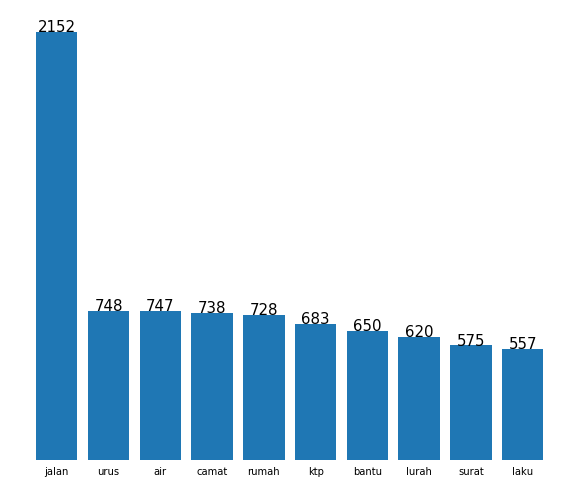

In [17]:
token = [sublist for l in token_keluhan for sublist in l]
counts = dict(Counter(token).most_common(10))
labels, values = zip(*counts.items())

# sort your values in descending order
indSort = np.argsort(values)[::-1]

# rearrange your data
labels = np.array(labels)[indSort]
values = np.array(values)[indSort]

indexes = np.arange(len(labels))

bar_width = 1

mybar=plt.bar(indexes, values)
# get rid of the frame
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# remove all the ticks and directly label each bar with respective value
plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')

# plt.show()

# direct label each bar with Y axis values
for bari in mybar:
    height = bari.get_height()
    plt.gca().text(bari.get_x() + bari.get_width()/2, bari.get_height()-0.2, str(int(height)),
                 ha='center', color='black', fontsize=15)
# add labels
plt.xticks(indexes, labels)
plt.show()

In [18]:
#membentuk tfidf
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
matrix = vectorizer.fit_transform(trainfinal)
print(matrix)


  (0, 3173)	0.17802756342391066
  (0, 4253)	0.20427886913832594
  (0, 130)	0.15802238712006392
  (0, 6398)	0.180697076952224
  (0, 1612)	0.1613526702859808
  (0, 8151)	0.2607139161378144
  (0, 6851)	0.3618705395147636
  (0, 735)	0.2128543631464554
  (0, 2592)	0.19384892042275825
  (0, 4027)	0.31191516192023105
  (0, 766)	0.25604609375805953
  (0, 5395)	0.2910196091690183
  (0, 1575)	0.32020556819659535
  (0, 8688)	0.23724085920472074
  (0, 9016)	0.39338887359005115
  (1, 2592)	0.17283646771956715
  (1, 6485)	0.14043785054020305
  (1, 4564)	0.14627436687092785
  (1, 6549)	0.20899016548458713
  (1, 7577)	0.17997718937004648
  (1, 2754)	0.22275461037366762
  (1, 8156)	0.306206669683773
  (1, 7827)	0.1847523999934524
  (1, 3085)	0.22106509794559173
  (1, 7561)	0.18182034454470106
  :	:
  (4202, 1518)	0.2372826751473194
  (4202, 6907)	0.2653910174875824
  (4203, 3173)	0.4094322807870318
  (4203, 4807)	0.09019959782335223
  (4203, 6133)	0.12580263356142965
  (4203, 9586)	0.08517022011354404


C:\Users\Laptop\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if hasattr(X, 'dtype') and np.issubdtype(X.dtype, np.float):


In [19]:
#terms data
terms = vectorizer.get_feature_names()
print(terms)

['aamiin', 'aan', 'ab', 'abaca', 'abadi', 'abai', 'abang', 'abar', 'abd', 'abdi', 'abdul', 'abg', 'abidin', 'abis', 'abonemen', 'abonmen', 'about', 'abs', 'absah', 'absen', 'absensi', 'abu', 'abubakar', 'ac', 'acang', 'acara', 'acau', 'acc', 'access', 'account', 'accurated', 'aceh', 'ach', 'achmad', 'acr', 'acra', 'actingnya', 'action', 'actionny', 'actionnya', 'acu', 'acuh', 'acurat', 'ad', 'adaa', 'adab', 'adain', 'adakan', 'adalag', 'adany', 'adap', 'address', 'ade', 'adek', 'adfik', 'adha', 'adhitya', 'adhiwacana', 'adi', 'adihusada', 'adik', 'adil', 'adipura', 'aditya', 'adiwirakusuma', 'adja', 'adk', 'adkah', 'adl', 'adlah', 'adlh', 'adm', 'administrasi', 'administrasitrims', 'administratif', 'administration', 'adminjam', 'adminmedia', 'adminstrasi', 'adok', 'adri', 'adu', 'aduh', 'advertising', 'adzan', 'adzikra', 'ae', 'aedangkan', 'aehari', 'aerah', 'af', 'afandi', 'affan', 'afgani', 'afiat', 'afifah', 'ag', 'aga', 'agam', 'agama', 'agen', 'agenda', 'ageng', 'agr', 'agraria', 

In [20]:
#membuat DTM
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer()
X = vec.fit_transform(trainfinal)
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
print(df)

      aamiin  aan  ab  abaca  abadi  abai  abang  abar  abd  abdi  ...    zg  \
0          0    0   0      0      0     0      0     0    0     0  ...     0   
1          0    0   0      0      0     0      0     0    0     0  ...     0   
2          0    0   0      0      0     0      0     0    0     0  ...     0   
3          0    0   0      0      0     0      0     0    0     0  ...     0   
4          0    0   0      0      0     0      0     0    0     0  ...     0   
5          0    0   0      0      0     0      0     0    0     0  ...     0   
6          0    0   0      0      0     0      0     0    0     0  ...     0   
7          0    0   0      0      0     0      0     0    0     0  ...     0   
8          0    0   0      0      0     0      0     0    0     0  ...     0   
9          0    0   0      0      0     0      0     0    0     0  ...     0   
10         0    0   0      0      0     0      0     0    0     0  ...     0   
11         0    0   0      0      0     

In [21]:
for i, feature in enumerate(vectorizer.get_feature_names()):
    print(i, feature)
    

0 aamiin
1 aan
2 ab
3 abaca
4 abadi
5 abai
6 abang
7 abar
8 abd
9 abdi
10 abdul
11 abg
12 abidin
13 abis
14 abonemen
15 abonmen
16 about
17 abs
18 absah
19 absen
20 absensi
21 abu
22 abubakar
23 ac
24 acang
25 acara
26 acau
27 acc
28 access
29 account
30 accurated
31 aceh
32 ach
33 achmad
34 acr
35 acra
36 actingnya
37 action
38 actionny
39 actionnya
40 acu
41 acuh
42 acurat
43 ad
44 adaa
45 adab
46 adain
47 adakan
48 adalag
49 adany
50 adap
51 address
52 ade
53 adek
54 adfik
55 adha
56 adhitya
57 adhiwacana
58 adi
59 adihusada
60 adik
61 adil
62 adipura
63 aditya
64 adiwirakusuma
65 adja
66 adk
67 adkah
68 adl
69 adlah
70 adlh
71 adm
72 administrasi
73 administrasitrims
74 administratif
75 administration
76 adminjam
77 adminmedia
78 adminstrasi
79 adok
80 adri
81 adu
82 aduh
83 advertising
84 adzan
85 adzikra
86 ae
87 aedangkan
88 aehari
89 aerah
90 af
91 afandi
92 affan
93 afgani
94 afiat
95 afifah
96 ag
97 aga
98 agam
99 agama
100 agen
101 agenda
102 ageng
103 agr
104 agraria
105 ag

1501 cntoh
1502 co
1503 coba
1504 cobra
1505 cocok
1506 code
1507 coklat
1508 colek
1509 collect
1510 collection
1511 colok
1512 colombo
1513 colombu
1514 com
1515 come
1516 comfirmasi
1517 comm
1518 command
1519 communication
1520 company
1521 compared
1522 competition
1523 complain
1524 computer
1525 conditions
1526 condong
1527 conect
1528 conference
1529 congested
1530 congratulate
1531 connect
1532 contact
1533 contoh
1534 contohktp
1535 control
1536 convention
1537 convex
1538 cool
1539 cop
1540 copet
1541 copy
1542 copypaste
1543 cor
1544 corat
1545 coreng
1546 coret
1547 corina
1548 corner
1549 corpus
1550 council
1551 country
1552 cowek
1553 cowok
1554 cp
1555 cpet
1556 cpns
1557 cpnya
1558 cpt
1559 cptra
1560 cq
1561 cr
1562 crab
1563 crane
1564 crazy
1565 cream
1566 cri
1567 critanya
1568 cross
1569 crowdid
1570 cs
1571 csr
1572 ct
1573 ctak
1574 cuaca
1575 cuci
1576 cucu
1577 cuil
1578 cukit
1579 cukiup
1580 culi
1581 culinary
1582 cultural
1583 culture
1584 culvert
1585 cu

2413 exprid
2414 ext
2415 extensively
2416 fa
2417 facebook
2418 faceebook
2419 factor
2420 fadi
2421 fadilah
2422 faham
2423 fahmy
2424 fahrezy
2425 fahrudin
2426 fair
2427 fairplay
2428 fakta
2429 faktane
2430 faktor
2431 fakultas
2432 falcon
2433 falit
2434 familiar
2435 fandy
2436 fanspage
2437 fany
2438 farah
2439 farida
2440 farma
2441 farmasi
2442 fase
2443 fashion
2444 fashionny
2445 fasibilitas
2446 fasilitas
2447 faskes
2448 fast
2449 fastrespon
2450 fasum
2451 fatal
2452 fathur
2453 fauzi
2454 fb
2455 fc
2456 feature
2457 feb
2458 febrian
2459 februari
2460 february
2461 febuary
2462 fee
2463 feedback
2464 feedbacknya
2465 feeder
2466 fendi
2467 fendy
2468 fenomena
2469 ferdy
2470 fest
2471 festifal
2472 festivak
2473 festival
2474 few
2475 fika
2476 fikelurahan
2477 fikry
2478 file
2479 filenya
2480 film
2481 final
2482 finally
2483 finansial
2484 finger
2485 fingerprint
2486 finish
2487 finishingnya
2488 finshing
2489 fira
2490 firdaus
2491 firmansyah
2492 first
2493 fish


3584 jurnalistik
3585 jurrasic
3586 juru
3587 jurus
3588 justicio
3589 juta
3590 juwingan
3591 juwita
3592 jwb
3593 jwban
3594 jx
3595 ka
3596 kaami
3597 kaau
3598 kab
3599 kabar
3600 kabeh
3601 kabel
3602 kabil
3603 kabul
3604 kabupaten
3605 kabur
3606 kaca
3607 kacab
3608 kacamatan
3609 kacau
3610 kad
3611 kada
3612 kadaluarsa
3613 kadaluarsanya
3614 kadang
3615 kadar
3616 kader
3617 kadih
3618 kadis
3619 kadishub
3620 kadispendukcapil
3621 kado
3622 kados
3623 kadung
3624 kaeih
3625 kaget
3626 kagum
3627 kah
3628 kaharudin
3629 kahfi
3630 kai
3631 kail
3632 kain
3633 kait
3634 kaji
3635 kak
3636 kakak
3637 kakek
3638 kakekek
3639 kaki
3640 kal
3641 kalah
3642 kalang
3643 kalas
3644 kali
3645 kalianak
3646 kalianyar
3647 kaliasin
3648 kalibokor
3649 kalibutuh
3650 kalidami
3651 kalijudan
3652 kalikediding
3653 kalikedinding
3654 kalikepiting
3655 kalilom
3656 kalimantan
3657 kalimas
3658 kalimat
3659 kalimir
3660 kaliondo
3661 kalirungkut
3662 kalisari
3663 kalisaridamen
3664 kalisos

4688 limbah
4689 limpah
4690 lin
4691 linda
4692 lindas
4693 lindung
4694 line
4695 lingkar
4696 lingkunan
4697 lingkung
4698 lingkup
4699 lingsor
4700 lini
4701 linimasa
4702 link
4703 linknya
4704 linmas
4705 lintang
4706 lintas
4707 lipat
4708 liponsos
4709 lips
4710 liput
4711 lirik
4712 lis
4713 lisa
4714 lisan
4715 list
4716 listrik
4717 literasi
4718 livable
4719 live
4720 living
4721 lk
4722 lkmk
4723 lkpd
4724 lm
4725 lma
4726 lmbr
4727 lngs
4728 lngsng
4729 lngsung
4730 lnjut
4731 lo
4732 load
4733 loading
4734 loadingnya
4735 loak
4736 lobang
4737 lobangnya
4738 log
4739 logika
4740 login
4741 logis
4742 logistik
4743 loh
4744 lok
4745 lokal
4746 lokalisasi
4747 lokasi
4748 loker
4749 loket
4750 lolos
4751 lomba
4752 loncat
4753 longok
4754 longsor
4755 lonjak
4756 lontar
4757 lopak
4758 lor
4759 lorong
4760 lot
4761 lotre
4762 lotus
4763 lounching
4764 love
4765 lowong
4766 loyal
4767 loyalitas
4768 lp
4769 lpj
4770 lpjnya
4771 lpmk
4772 lpngan
4773 lppnri
4774 lpse
4775 ls

5988 novidah
5989 novita
5990 novitasari
5991 npwnya
5992 npwp
5993 npwpnya
5994 nr
5995 nrimo
5996 nss
5997 ntah
5998 ntar
5999 nti
6000 ntt
6001 ntuk
6002 nty
6003 nuansa
6004 nugroho
6005 nulis
6006 numpang
6007 numpuk
6008 nunda
6009 nunggu
6010 nungguin
6011 nunggunya
6012 nungu
6013 nunut
6014 nuptk
6015 nur
6016 nurhasan
6017 nuriyati
6018 nurlela
6019 nurmiah
6020 nurmiahberbagi
6021 nurul
6022 nurut
6023 nurwati
6024 nuryudi
6025 nusa
6026 nusanindyah
6027 nusantara
6028 nuwon
6029 nuwun
6030 nuwunsewu
6031 nwn
6032 nwun
6033 nwuun
6034 nwuuun
6035 ny
6036 nya
6037 nyaa
6038 nyadn
6039 nyala
6040 nyaman
6041 nyamar
6042 nyambung
6043 nyampaikan
6044 nyampe
6045 nyampek
6046 nyamplung
6047 nyamuk
6048 nyandar
6049 nyari
6050 nyata
6051 nyawa
6052 nyebrang
6053 nyelesaikan
6054 nyelipin
6055 nyelonong
6056 nyepi
6057 nyerah
6058 nyeri
6059 nyetak
6060 nyetel
6061 nyewa
6062 nyinyir
6063 nyoman
6064 nyumet
6065 nyuruh
6066 nyuwun
6067 oasis
6068 oayah
6069 obat
6070 objek
6071 ob

7161 rambutan
7162 rame
7163 ramping
7164 rampok
7165 rampung
7166 rana
7167 rancang
7168 rancu
7169 randu
7170 rang
7171 rangakh
7172 rangka
7173 rangkai
7174 rangkap
7175 ranmor
7176 rantau
7177 ranting
7178 rapat
7179 rapi
7180 rapika
7181 rapor
7182 rapot
7183 rapuh
7184 rasasnya
7185 rasha
7186 raskin
7187 rastra
7188 rasulullaah
7189 rather
7190 ratingnya
7191 ratna
7192 ratu
7193 ratus
7194 rawa
7195 rawan
7196 rawasan
7197 rawat
7198 rawon
7199 raya
7200 rayajalan
7201 rayan
7202 rayap
7203 rayon
7204 rayyan
7205 razia
7206 rb
7207 rban
7208 rd
7209 rdk
7210 re
7211 reach
7212 ready
7213 realisasi
7214 realise
7215 rebek
7216 rebut
7217 recheck
7218 recom
7219 recomendasi
7220 record
7221 reda
7222 redam
7223 redita
7224 referensi
7225 reformasi
7226 refresh
7227 regard
7228 regards
7229 regency
7230 register
7231 registered
7232 registrasi
7233 registrasj
7234 regulasi
7235 reguler
7236 rehabilitasi
7237 rejo
7238 rejosari
7239 rek
7240 reka
7241 rekam
7242 rekan
7243 rekap
72

8299 smile
8300 smk
8301 smkn
8302 smn
8303 smntra
8304 smoga
8305 smp
8306 smpah
8307 smpai
8308 smpaikan
8309 smpat
8310 smpe
8311 smpek
8312 smph
8313 smpn
8314 sms
8315 smu
8316 smua
8317 smw
8318 sndiri
8319 sndr
8320 sngat
8321 snggup
8322 sngt
8323 sni
8324 snm
8325 snmptn
8326 so
8327 soalanya
8328 soale
8329 soalnnya
8330 soalx
8331 sobek
8332 socmed
8333 sodakoh
8334 sodara
8335 sodok
8336 sodor
8337 soedirman
8338 soedjito
8339 soehita
8340 soekarno
8341 soekarwo
8342 soekristian
8343 soemarmi
8344 soenjoto
8345 soepratman
8346 soerianto
8347 soetomo
8348 soetrisno
8349 soewandhi
8350 soewandhie
8351 soewandi
8352 soewardi
8353 soewoyo
8354 soft
8355 softfile
8356 softkopinya
8357 software
8358 sok
8359 soka
8360 sokbicara
8361 soko
8362 soleha
8363 soleman
8364 solo
8365 solosi
8366 solusi
8367 solusiny
8368 solutif
8369 solutions
8370 solve
8371 sombo
8372 sombong
8373 some
8374 song
8375 sono
8376 sonokwijenan
8377 soon
8378 sop
8379 sopan
8380 sopir
8381 sopo
8382 soredi

9459 ty
9460 tya
9461 uang
9462 uangpdhl
9463 uanh
9464 uap
9465 uas
9466 ubah
9467 ubaya
9468 ubayaantara
9469 ubi
9470 ubung
9471 ucapakan
9472 ucapkn
9473 udan
9474 udang
9475 udara
9476 ugal
9477 ugalan
9478 ugm
9479 ugo
9480 uinsa
9481 ujan
9482 uji
9483 uju
9484 ujung
9485 ujuran
9486 uk
9487 ukl
9488 ukm
9489 ukt
9490 ukur
9491 ukuranya
9492 ulah
9493 ulan
9494 ulang
9495 ulangtahun
9496 ular
9497 ulas
9498 ulat
9499 uleg
9500 ulegnya
9501 ulek
9502 ulis
9503 ulta
9504 ulum
9505 ulung
9506 ulur
9507 um
9508 umat
9509 umbul
9510 umk
9511 umkm
9512 umpama
9513 umr
9514 umroh
9515 umu
9516 umur
9517 un
9518 unair
9519 unbk
9520 unda
9521 undang
9522 under
9523 underpass
9524 undi
9525 undip
9526 unduh
9527 undur
9528 uneg
9529 unek
9530 unesa
9531 ungaran
9532 unggah
9533 unggas
9534 unggul
9535 unhtuk
9536 unit
9537 units
9538 univ
9539 universitas
9540 university
9541 univrsta
9542 unjung
9543 unkm
9544 unmer
9545 unsur
9546 unt
9547 untag
9548 untik
9549 untk
9550 untuj
9551 unt

In [22]:
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(matrix)
print(dist)

[[ 0.00000000e+00  9.66495837e-01  1.00000000e+00 ...  9.27109769e-01
   1.00000000e+00  1.00000000e+00]
 [ 9.66495837e-01  0.00000000e+00  9.65427466e-01 ...  1.00000000e+00
   9.62997154e-01  9.24889470e-01]
 [ 1.00000000e+00  9.65427466e-01  0.00000000e+00 ...  1.00000000e+00
   1.00000000e+00  1.00000000e+00]
 ...
 [ 9.27109769e-01  1.00000000e+00  1.00000000e+00 ...  1.11022302e-16
   9.24032649e-01  1.00000000e+00]
 [ 1.00000000e+00  9.62997154e-01  1.00000000e+00 ...  9.24032649e-01
   0.00000000e+00  8.63415934e-01]
 [ 1.00000000e+00  9.24889470e-01  1.00000000e+00 ...  1.00000000e+00
   8.63415934e-01 -2.22044605e-16]]


For n_clusters=2, The SSE is 4091.9741726429393
For n_clusters=3, The SSE is 4057.5494374797154
For n_clusters=4, The SSE is 4026.688196052114
For n_clusters=5, The SSE is 3994.8390026841876
For n_clusters=6, The SSE is 3978.733106128094
For n_clusters=7, The SSE is 3946.6434415909616
For n_clusters=8, The SSE is 3930.6233321409845
For n_clusters=9, The SSE is 3912.5250141873125
For n_clusters=10, The SSE is 3901.7301098777903
For n_clusters=11, The SSE is 3891.6467457717604
For n_clusters=12, The SSE is 3875.9114067377445
For n_clusters=13, The SSE is 3874.8067596047517
For n_clusters=14, The SSE is 3862.3102550226254
For n_clusters=15, The SSE is 3846.8905404895468
For n_clusters=16, The SSE is 3831.1356040614633
For n_clusters=17, The SSE is 3822.926615074769
For n_clusters=18, The SSE is 3819.7484429131205


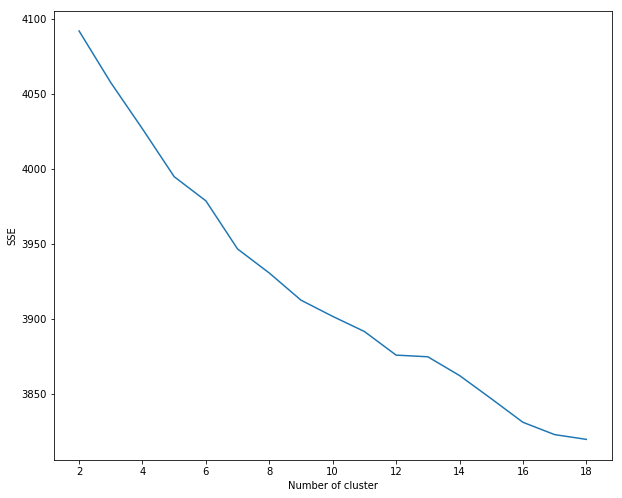

In [23]:
#mendapatkan SSE untuk klaster optimum

from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
max_klaster=19

sse = {}
for k in range(2, max_klaster):
    kmeans = KMeans(n_clusters=k,random_state=1).fit(matrix)
    clusters = kmeans.labels_.tolist()
    clusters_df=pd.DataFrame(clusters)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    print("For n_clusters={}, The SSE is {}".format(k, sse[k]))
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [34]:
#mendapatkan silhouette value untuk klaster optimum
from sklearn.metrics import silhouette_score

for n_cluster in range(2, max_klaster ):
    kmeans = KMeans(n_clusters=n_cluster,random_state=1).fit(matrix)
    label = kmeans.labels_
    sil_coeff = silhouette_score(matrix, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.008497437330806804
For n_clusters=3, The Silhouette Coefficient is 0.00924516659285131
For n_clusters=4, The Silhouette Coefficient is 0.011670663689205588
For n_clusters=5, The Silhouette Coefficient is 0.014826923037331017
For n_clusters=6, The Silhouette Coefficient is 0.015689615428112973
For n_clusters=7, The Silhouette Coefficient is 0.018439165120628456
For n_clusters=8, The Silhouette Coefficient is 0.0187697973380513
For n_clusters=9, The Silhouette Coefficient is 0.019833361521493575
For n_clusters=10, The Silhouette Coefficient is 0.019844818598145016
For n_clusters=11, The Silhouette Coefficient is 0.02162336612044958
For n_clusters=12, The Silhouette Coefficient is 0.02192193105958885
For n_clusters=13, The Silhouette Coefficient is 0.019887889587288262
For n_clusters=14, The Silhouette Coefficient is 0.020155749367422066
For n_clusters=15, The Silhouette Coefficient is 0.01814857045968768
For n_clusters=16, The Silhouette 

For n_clusters=2, The CHI is 50.06477201747444
For n_clusters=3, The CHI is 43.06813640312947
For n_clusters=4, The CHI is 39.66021562590236
For n_clusters=5, The CHI is 38.348379660441985
For n_clusters=6, The CHI is 34.19587555007262
For n_clusters=7, The CHI is 34.411682248939655
For n_clusters=8, The CHI is 32.053156673852456
For n_clusters=9, The CHI is 30.596314205706232
For n_clusters=10, The CHI is 28.555366402592636
For n_clusters=11, The CHI is 26.847214096378313
For n_clusters=12, The CHI is 26.04768439024535
For n_clusters=13, The CHI is 23.97776948800488
For n_clusters=14, The CHI is 23.242966625836736
For n_clusters=15, The CHI is 22.864027539817553
For n_clusters=16, The CHI is 22.571116609188202
For n_clusters=17, The CHI is 21.762989893440952
For n_clusters=18, The CHI is 20.699937512300156


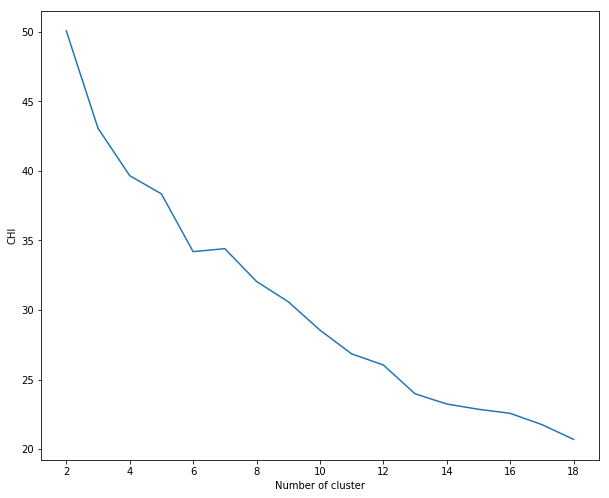

In [25]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn import datasets
import numpy as np
from sklearn.cluster import KMeans

chi = {}
for k in range(2, max_klaster):
    kmeans_model = KMeans(n_clusters=k, random_state=1).fit(matrix)
    labels = kmeans_model.labels_
    chi[k] = metrics.calinski_harabaz_score(matrix.toarray(), labels)
    print("For n_clusters={}, The CHI is {}".format(k, chi[k]))
plt.figure()
plt.plot(list(chi.keys()), list(chi.values()))
plt.xlabel("Number of cluster")
plt.ylabel("CHI")
plt.show()

In [30]:
#menjalankan k-means untuk klaster optimum
from sklearn.cluster import KMeans

num_clusters = 2

km = KMeans(n_clusters=num_clusters,random_state=1)

%time km.fit(matrix)

clusters = km.labels_.tolist()
y_kmeans = km.predict(matrix)
input_df['klaster'] = pd.Series(y_kmeans, index=input_df.index)

Wall time: 9.4 s


In [31]:
#mendapatkan banyak anggota tiap klaster
from sklearn.externals import joblib
joblib.dump(km,  'doc_cluster.pkl')

km = joblib.load('doc_cluster.pkl')
clusters = km.labels_.tolist()
clusters_df=pd.DataFrame(clusters)
clusters_df['klaster']=pd.DataFrame(clusters)
clusters_df['klaster'].value_counts()

1    3765
0     441
Name: klaster, dtype: int64

In [32]:
#membuat data frame anggota klaster 
train_final_df=pd.DataFrame(trainfinal)
train_final_df.columns=['opini']
train_final_df['klaster']=pd.Series(y_kmeans, index=input_df.index)
train_final_df

,opini,klaster
0,info kondisi air pdam daerah simo pomahan barat gang keruh bau minum cuci susah terimakasii,1
1,pemkot lapor penuh sampah got simolawang sekolah gang ii salur buntu banjir hujan lebat mohn tangan terimakasih robert prayogo,1
2,lapor lampu taman jalan kedung sroko mati titik ditindaklanjuti,1
3,tumpu sampah banyu urip,1
4,info putus sertifikasi tanah surat ijo,1
5,giat bakar ilalang tertib khusus wilayah lurah medok ayu lokasi tpu medok ayu,1
6,perijinan warnet coba masuk ssw lihat pilih perijinan warnet bingung coba telepon dinas kominfo jimerto coba telepon bilang perijinan online warnet hapus urus perijinan warnet info,1
7,ngurus surat terang bebas narkoba piye,1
8,kaji ulang durasi lampu lintas merr suko semolo khusus arah utara selatan jam sibuk pulang kantor durasi lampu hijau pendek antri kendara capai kompleks ruko icon antri kendara arah,1
9,informasi kait instansi perintah gerak bidang hukum kota khusus adil negeri jaksa polisi cerita alam mei hadap adil lantar kena langgar hukum kendara kena tilang pasal uu tanggal april jembatan suramadu kenjaran kantor adil tugas adil adil sidang langgar tilang langsung jaksa gedung dprd sampa gedung dprd deket kantor jaksa alih samsat colombu urus tilang pindah samsat manyar setelh mondar-mandir samsat manyar kait surat tilngannya samsat yp kamal akhirny kesana lantar capek bolak-balik instansi kait jarak instansi instansi kena macet laku aktivitas wajib mahasiswa kuliah adu layan cari tau ambil surat tilang tilang aparat suruh adil tanggal mei jam sesuai tera surat tilang mintk informasi biar mudah ambil,1


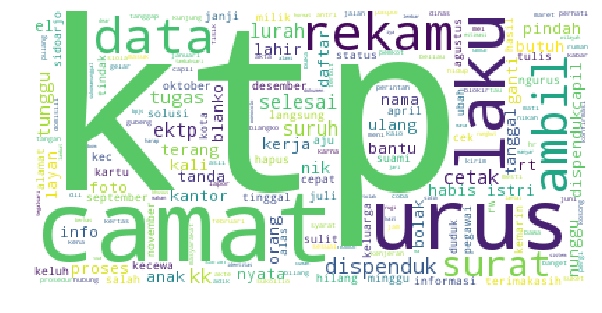

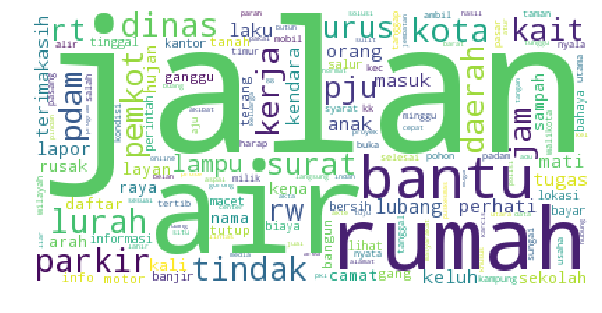

In [33]:
a = {}
b = {}
klaster = {}
i = -1
c = {}
for j in range(num_clusters):
    i += 1
    a[i] = train_final_df.loc[train_final_df['klaster'] == i,'opini']
    b[i] =' '.join(a[i])
    klaster["klaster" + str(i)]  = b[i]
    c[i]= WordCloud(collocations = False,background_color='white',stopwords=stopword,max_words=2000,max_font_size=200,
                    random_state=42).generate(b[i])
    fig = plt.figure(1)
    plt.imshow(c[i])
    plt.axis('off')
    plt.show()